# Importarea librariilor necesare

In [151]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /home/ivan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/ivan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# Citirea datelor din fisierul CSV

In [37]:
df = pd.read_csv("./datasets/wines_raw.csv")

# Analiza primara a datelor

In [7]:
df.head()

,country,description,designation,points,price,province,region_1,region_2,variety,winery,title,vintage,alcohol,category
0,Spain,"Consistent with past vintages, this crianza ge...",Crianza,86.0,25.0,Northern Spain,Ribera del Duero,Central Coast,Tempranillo,Alidis,Alidis 2004 Crianza (Ribera del Duero),2004.0,14.0,Red
1,US,The Indelicato family's vineyard is basically ...,Three Crowns Single Vineyard,90.0,30.0,California,San Bernabe,Central Coast,Red Blend,Diora,Diora 2012 Three Crowns Single Vineyard Red (S...,2011.0,13.5,Red
2,Germany,Long extended veins of bramble and dried herb ...,Rotwein Trocken,90.0,34.0,Rheinhessen,Central Coast,Central Coast,SpГ¤tburgunder,Wittmann,Wittmann 2012 Rotwein Trocken SpГ¤tburgunder (...,2012.0,13.0,Red
3,Italy,This is a fresh and luminous blend of Sauvigno...,Vino Bianco,88.0,17.0,Piedmont,Monferrato,Central Coast,White Blend,Quattro Leoni,Quattro Leoni 2008 Vino Bianco White (Monferrato),2008.0,12.0,White
4,Italy,"Aromas of red berry, blue flower, menthol, exo...",Sassicaia,95.0,235.0,Tuscany,Bolgheri Sassicaia,Central Coast,Red Blend,Tenuta San Guido,Tenuta San Guido 2014 Sassicaia (Bolgheri Sas...,2014.0,13.0,Red


In [8]:
df.shape

(57198, 14)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57198 entries, 0 to 57197
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      57198 non-null  object 
 1   description  57198 non-null  object 
 2   designation  57198 non-null  object 
 3   points       57198 non-null  float64
 4   price        57198 non-null  float64
 5   province     57198 non-null  object 
 6   region_1     57198 non-null  object 
 7   region_2     57198 non-null  object 
 8   variety      57198 non-null  object 
 9   winery       57198 non-null  object 
 10  title        57198 non-null  object 
 11  vintage      57198 non-null  float64
 12  alcohol      57198 non-null  float64
 13  category     57198 non-null  object 
dtypes: float64(4), object(10)
memory usage: 6.1+ MB


# Procesarea datelor

## Curatarea datelor

### Identificarea datelor lipsa

In [11]:
df.isna().sum().sort_values(ascending=False)

country        0
description    0
designation    0
points         0
price          0
province       0
region_1       0
region_2       0
variety        0
winery         0
title          0
vintage        0
alcohol        0
category       0
dtype: int64

In [41]:
missing_percent = df.isna().mean().sort_values(ascending=False) * 100
missing_percent

country          0.0
description      0.0
designation      0.0
points           0.0
price            0.0
province         0.0
region_1         0.0
region_2         0.0
variety          0.0
winery           0.0
title            0.0
vintage          0.0
alcohol          0.0
category         0.0
quality_price    0.0
dtype: float64

### Identificarea dublicatelor

In [13]:
df.duplicated().sum()

np.int64(0)

## Transformari

### Cream o variabila noua ce reflecta raportul pret/calitate

In [38]:
df["quality_price"] = df["points"] / df["price"]

In [19]:
df.head()

,country,description,designation,points,price,province,region_1,region_2,variety,winery,title,vintage,alcohol,category,quality_price
0,Spain,"Consistent with past vintages, this crianza ge...",Crianza,86.0,25.0,Northern Spain,Ribera del Duero,Central Coast,Tempranillo,Alidis,Alidis 2004 Crianza (Ribera del Duero),2004.0,14.0,Red,3.440000
1,US,The Indelicato family's vineyard is basically ...,Three Crowns Single Vineyard,90.0,30.0,California,San Bernabe,Central Coast,Red Blend,Diora,Diora 2012 Three Crowns Single Vineyard Red (S...,2011.0,13.5,Red,3.000000
2,Germany,Long extended veins of bramble and dried herb ...,Rotwein Trocken,90.0,34.0,Rheinhessen,Central Coast,Central Coast,SpГ¤tburgunder,Wittmann,Wittmann 2012 Rotwein Trocken SpГ¤tburgunder (...,2012.0,13.0,Red,2.647059
3,Italy,This is a fresh and luminous blend of Sauvigno...,Vino Bianco,88.0,17.0,Piedmont,Monferrato,Central Coast,White Blend,Quattro Leoni,Quattro Leoni 2008 Vino Bianco White (Monferrato),2008.0,12.0,White,5.176471
4,Italy,"Aromas of red berry, blue flower, menthol, exo...",Sassicaia,95.0,235.0,Tuscany,Bolgheri Sassicaia,Central Coast,Red Blend,Tenuta San Guido,Tenuta San Guido 2014 Sassicaia (Bolgheri Sas...,2014.0,13.0,Red,0.404255


### Standartizam coloanele categorice

In [34]:
sorted(list(set(df["country"])))

['Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Bosnia - Herzegovina',
 'Bosnia and Herzegovina',
 'Brazil',
 'Bulgaria',
 'Canada',
 'Chile',
 'China',
 'China (Mainland)',
 'Colombia',
 'Croatia',
 'Cyprus',
 'Czech Republic',
 'Egypt',
 'England',
 'France',
 'Georgia',
 'Germany',
 'Greece',
 'Hungary',
 'India',
 'Indonesia',
 'Israel',
 'Italy',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kosovo',
 'Lebanon',
 'Lithuania',
 'Luxembourg',
 'Macedonia',
 'Malta',
 'Mexico',
 'Moldova',
 'Montenegro',
 'Morocco',
 'New Zealand',
 'North Macedonia',
 'Peru',
 'Poland',
 'Portugal',
 'Romania',
 'Russia',
 'Russian Federation',
 'Serbia',
 'Slovenia',
 'South Africa',
 'South Korea',
 'Spain',
 'Sweden',
 'Switzerland',
 'Taiwan (Greater China)',
 'Turkey',
 'US',
 'USA',
 'Ukraine',
 'United Kingdom',
 'United States',
 'Uruguay']

In [39]:
mapCountries = {
    "Bosnia - Herzegovina": "Bosnia and Herzegovina",
    "China": "China (Mainland)",
    "Macedonia": "North Macedonia",
    "Russia": "Russian Federation",
    "US": "United States",
    "USA": "United States",
}
print("Counties Nr before cleanup: ", len(set(df.country)))
df["country"] = df["country"].replace(mapCountries)
print("Countries Nr after cleanup: ", len(set(df.country)))

Counties Nr before cleanup:  63
Countries Nr after cleanup:  57


In [44]:
sorted(list(set(df["category"])))

['Dessert',
 'Fortified',
 'Orange',
 'Port/Sherry',
 'Red',
 'Rose',
 'Rosé',
 'Sparkling',
 'White']

In [45]:
mapCategory = {
    "Rosé": "Rose"
}
df["category"] = df["category"].replace(mapCategory)

In [46]:
df["country"] = df["country"].astype("category")
df["category"] = df["category"].astype("category")

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57198 entries, 0 to 57197
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   country        57198 non-null  category
 1   description    57198 non-null  object  
 2   designation    57198 non-null  object  
 3   points         57198 non-null  float64 
 4   price          57198 non-null  float64 
 5   province       57198 non-null  object  
 6   region_1       57198 non-null  object  
 7   region_2       57198 non-null  object  
 8   variety        57198 non-null  object  
 9   winery         57198 non-null  object  
 10  title          57198 non-null  object  
 11  vintage        57198 non-null  float64 
 12  alcohol        57198 non-null  float64 
 13  category       57198 non-null  category
 14  quality_price  57198 non-null  float64 
dtypes: category(2), float64(5), object(8)
memory usage: 5.8+ MB


## Explorarea initiala

### Statistici descriptive pentru valori numerice

In [48]:
df[['price', 'points', 'alcohol', 'quality_price']].describe()

,price,points,alcohol,quality_price
count,57198.000000,57198.000000,57198.000000,57198.000000
mean,32.304930,88.515612,13.637061,3.814515
std,33.195029,3.146780,13.696953,2.029503
min,4.000000,80.000000,0.000000,0.038400
25%,20.000000,86.000000,13.500000,2.485714
50%,25.000000,88.000000,13.500000,3.541667
75%,35.000000,91.000000,14.000000,4.500000
max,2500.000000,100.000000,3000.000000,21.000000


In [56]:
# stergem outlinerele

# pentru alcool mergem pe valori fixe
df = df[(df['alcohol'] >= 5) & (df['alcohol'] <= 25)]

numeric_cols = ['price', 'points', 'quality_price']
# Calculăm percentilele 1% și 99% pentru fiecare variabilă numerică
q_low = df[numeric_cols].quantile(0.01)
q_high = df[numeric_cols].quantile(0.99)

mask = ((df[numeric_cols] >= q_low) & (df[numeric_cols] <= q_high)).all(axis=1)

df_clean = df[mask].copy()
df_clean.shape

(53940, 15)

In [57]:
df = df_clean

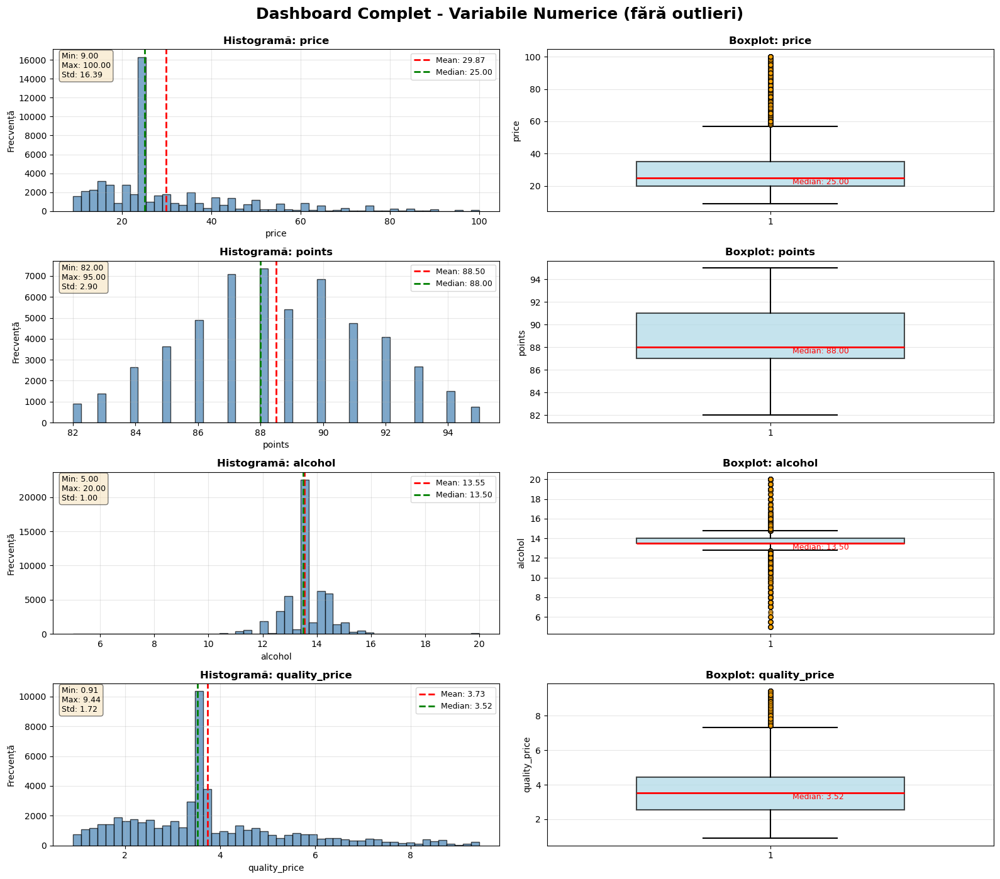


STATISTICI DESCRIPTIVE DETALIATE (după eliminarea outlierilor)
          price   points   alcohol  quality_price
count  53940.00  53940.0  53940.00       53940.00
mean      29.87     88.5     13.55           3.73
std       16.39      2.9      1.00           1.72
min        9.00     82.0      5.00           0.91
25%       20.00     87.0     13.50           2.53
50%       25.00     88.0     13.50           3.52
75%       35.00     91.0     14.00           4.45
max      100.00     95.0     20.00           9.44


In [78]:
numeric_cols = ['price', 'points', 'alcohol', 'quality_price']

# Creăm un grid 4x2: 4 rânduri (câte unul per variabilă), 2 coloane (histogramă + boxplot)
fig, axes = plt.subplots(4, 2, figsize=(16, 14))
fig.suptitle('Dashboard Complet - Variabile Numerice (fără outlieri)', 
             fontsize=18, fontweight='bold', y=0.995)

for idx, col in enumerate(numeric_cols):
    data = df_clean[col].dropna()
    
    # === HISTOGRAMĂ (coloana stângă) ===
    ax_hist = axes[idx, 0]
    ax_hist.hist(data, bins=50, alpha=0.7, color='steelblue', edgecolor='black')
    
    # Linii pentru medie și mediană
    mean_val = data.mean()
    median_val = data.median()
    
    ax_hist.axvline(mean_val, color='red', linestyle='--', linewidth=2, 
                    label=f'Mean: {mean_val:.2f}')
    ax_hist.axvline(median_val, color='green', linestyle='--', linewidth=2, 
                    label=f'Median: {median_val:.2f}')
    
    ax_hist.set_title(f'Histogramă: {col}', fontsize=12, fontweight='bold')
    ax_hist.set_xlabel(col, fontsize=10)
    ax_hist.set_ylabel('Frecvență', fontsize=10)
    ax_hist.legend(loc='upper right', fontsize=9)
    ax_hist.grid(True, alpha=0.3)
    
    # Text cu statistici
    stats_text = f'Min: {data.min():.2f}\nMax: {data.max():.2f}\nStd: {data.std():.2f}'
    ax_hist.text(0.02, 0.98, stats_text, transform=ax_hist.transAxes, 
                fontsize=9, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # === BOXPLOT (coloana dreaptă) ===
    ax_box = axes[idx, 1]
    bp = ax_box.boxplot(data, vert=True, patch_artist=True, widths=0.6,
                        boxprops=dict(facecolor='lightblue', alpha=0.7, linewidth=1.5),
                        medianprops=dict(color='red', linewidth=2),
                        whiskerprops=dict(linewidth=1.5),
                        capprops=dict(linewidth=1.5),
                        flierprops=dict(marker='o', markerfacecolor='orange', 
                                       markersize=5, alpha=0.5))
    
    ax_box.set_title(f'Boxplot: {col}', fontsize=12, fontweight='bold')
    ax_box.set_ylabel(col, fontsize=10)
    ax_box.grid(True, alpha=0.3, axis='y')
    
    # Adăugăm etichetă pentru mediană
    median_text = f'Median: {median_val:.2f}'
    ax_box.text(1.05, median_val, median_text, fontsize=9, 
                verticalalignment='top', color='red', fontweight='normal')

plt.tight_layout()
plt.savefig("./figures/stat_descriptiva_numerice.pdf", bbox_inches='tight')
plt.show()

# Tabel cu statistici
print("\n" + "="*70)
print("STATISTICI DESCRIPTIVE DETALIATE (după eliminarea outlierilor)")
print("="*70)
print(df_clean[numeric_cols].describe().round(2))

### Distributia variabilelor categorice

#### Distributia dupa tari

In [74]:
country_counts = df_clean['country'].value_counts()

# Calculăm numărul de țări
num_countries = len(country_counts)

# Împărțim în două coloane
half_point = (num_countries + 1) // 2 # +1 pentru a asigura că prima coloană are cel puțin la fel de multe elemente

col1 = country_counts.iloc[:half_point]
col2 = country_counts.iloc[half_point:]

# Creăm un DataFrame pentru afișare
# Reindexăm col2 pentru a se alinia cu col1, umplând cu NaN unde nu există corespondență
# Apoi umplem NaN-urile cu un string gol pentru o afișare mai curată
display_df = pd.DataFrame({
    'Țara': col1.index,
    'Total': col1.values,
    'Țara ': col2.index.tolist() + [''] * (len(col1) - len(col2)), # Adăugăm stringuri goale dacă col2 e mai scurtă
    'Total ': col2.values.tolist() + [''] * (len(col1) - len(col2))
})

# Afișăm tabelul
print("Distribuția vinurilor pe țări:")
print(display_df.to_string(index=False)) # to_string pentru a afișa tot fără trunchiere

Distribuția vinurilor pe țări:
            Țara  Total                  Țara  Total 
   United States  24927                 Brazil     34
          France   8220                 Mexico     34
           Italy   7534                  Japan     30
           Spain   2625        North Macedonia     21
        Portugal   1689                 Cyprus     18
       Australia   1446                England     14
           Chile   1334     Russian Federation     13
       Argentina   1243 Bosnia and Herzegovina     13
         Austria    896                  India     11
    South Africa    819                Armenia     10
     New Zealand    736                Lebanon      8
         Germany    655                Ukraine      7
          Greece    264                Morocco      7
          Israel    190             Luxembourg      5
          Canada    185                   Peru      4
         Croatia    133             Kazakhstan      3
        Slovenia    106                  Malta     

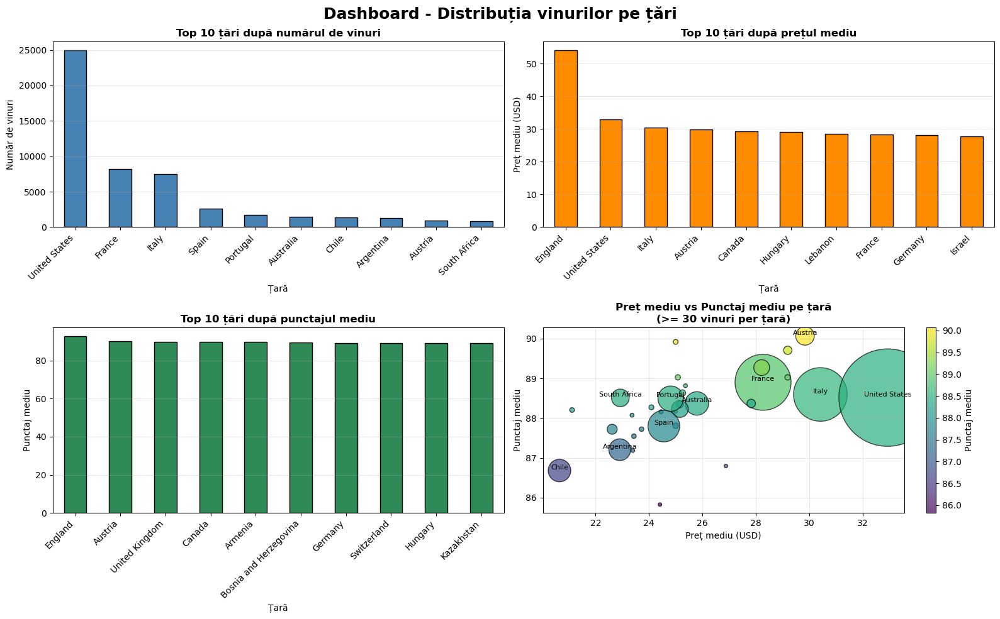

In [81]:
import matplotlib.pyplot as plt
import pandas as pd

dfc = df_clean.copy()

# 1. Număr de vinuri pe țară
country_counts = dfc['country'].value_counts()

# 2. Preț mediu pe țară
country_price_mean = dfc.groupby('country', observed=False)['price'].mean().sort_values(ascending=False)

# 3. Punctaj mediu pe țară
country_points_mean = dfc.groupby('country', observed=False)['points'].mean().sort_values(ascending=False)

# 4. DataFrame combinat pentru scatter (preț mediu vs punctaj mediu)
country_stats = pd.DataFrame({
    'count': country_counts,
    'mean_price': country_price_mean,
    'mean_points': country_points_mean
}).dropna()

min_count = 30  # minim vinuri per țară pentru scatter
country_stats_filtered = country_stats[country_stats['count'] >= min_count]

top_n = 10
top_countries_by_count = country_counts.head(top_n)
top_countries_by_price = country_price_mean.head(top_n)
top_countries_by_points = country_points_mean.head(top_n)

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle('Dashboard - Distribuția vinurilor pe țări', fontsize=18, fontweight='bold')

# 1) Top țări după număr de vinuri
ax1 = axes[0, 0]
top_countries_by_count.plot(kind='bar', ax=ax1, color='steelblue', edgecolor='black')
ax1.set_title(f'Top {top_n} țări după numărul de vinuri', fontsize=12, fontweight='bold')
ax1.set_xlabel('Țară')
ax1.set_ylabel('Număr de vinuri')
ax1.tick_params(axis='x', labelrotation=45)  # doar rotația
for label in ax1.get_xticklabels():
    label.set_ha('right')  # alinere la dreapta
ax1.grid(axis='y', alpha=0.3)

# 2) Top țări după prețul mediu
ax2 = axes[0, 1]
top_countries_by_price.plot(kind='bar', ax=ax2, color='darkorange', edgecolor='black')
ax2.set_title(f'Top {top_n} țări după prețul mediu', fontsize=12, fontweight='bold')
ax2.set_xlabel('Țară')
ax2.set_ylabel('Preț mediu (USD)')
ax2.tick_params(axis='x', labelrotation=45)
for label in ax2.get_xticklabels():
    label.set_ha('right')
ax2.grid(axis='y', alpha=0.3)

# 3) Top țări după punctajul mediu
ax3 = axes[1, 0]
top_countries_by_points.plot(kind='bar', ax=ax3, color='seagreen', edgecolor='black')
ax3.set_title(f'Top {top_n} țări după punctajul mediu', fontsize=12, fontweight='bold')
ax3.set_xlabel('Țară')
ax3.set_ylabel('Punctaj mediu')
ax3.tick_params(axis='x', labelrotation=45)
for label in ax3.get_xticklabels():
    label.set_ha('right')
ax3.grid(axis='y', alpha=0.3)

# 4) Scatter: preț mediu vs punctaj mediu
ax4 = axes[1, 1]
scatter = ax4.scatter(
    country_stats_filtered['mean_price'],
    country_stats_filtered['mean_points'],
    s=country_stats_filtered['count'] * 0.5,
    alpha=0.7,
    c=country_stats_filtered['mean_points'],
    cmap='viridis',
    edgecolor='black'
)

ax4.set_title(f'Preț mediu vs Punctaj mediu pe țară\n(>= {min_count} vinuri per țară)',
              fontsize=12, fontweight='bold')
ax4.set_xlabel('Preț mediu (USD)')
ax4.set_ylabel('Punctaj mediu')

# Etichetăm câteva țări cu cele mai multe vinuri
for country, row in country_stats_filtered.sort_values('count', ascending=False).head(10).iterrows():
    ax4.text(row['mean_price'], row['mean_points'], country,
             fontsize=8, ha='center', va='bottom')

cbar = plt.colorbar(scatter, ax=ax4)
cbar.set_label('Punctaj mediu')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("./figures/distributie_tari.pdf", bbox_inches='tight')
plt.show()

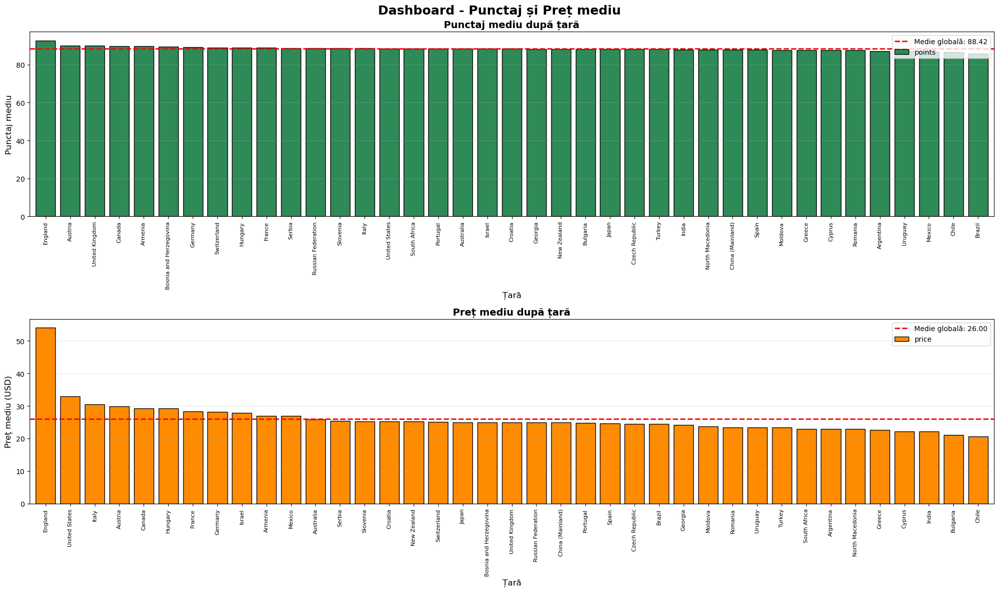

In [88]:
dfc = df_clean.copy()

# Calculăm statistici pe țară
country_stats = dfc.groupby('country', observed=False).agg({
    'points': 'mean',
    'price': 'mean',
    'country': 'count'  # număr de vinuri
}).rename(columns={'country': 'count'})

# Păstrăm doar țările cu >= 10 vinuri
min_wines = 10
country_stats = country_stats[country_stats['count'] >= min_wines]

# Sortăm după punctaj mediu (descrescător)
country_stats_by_points = country_stats.sort_values('points', ascending=False)

# Sortăm după preț mediu (descrescător)
country_stats_by_price = country_stats.sort_values('price', ascending=False)

# === Dashboard cu 2 rânduri ===
fig, axes = plt.subplots(2, 1, figsize=(20, 12))
fig.suptitle('Dashboard - Punctaj și Preț mediu', 
             fontsize=18, fontweight='bold')

# 1) Punctaj mediu după țară (toate țările)
ax1 = axes[0]
country_stats_by_points['points'].plot(kind='bar', ax=ax1, 
                                        color='seagreen', edgecolor='black', width=0.8)
ax1.set_title('Punctaj mediu după țară', fontsize=14, fontweight='bold')
ax1.set_xlabel('Țară', fontsize=12)
ax1.set_ylabel('Punctaj mediu', fontsize=12)
ax1.tick_params(axis='x', labelrotation=90, labelsize=8)
ax1.axhline(country_stats['points'].mean(), color='red', linestyle='--', 
            linewidth=2, label=f'Medie globală: {country_stats["points"].mean():.2f}')
ax1.legend(loc='upper right')
ax1.grid(axis='y', alpha=0.3)

# 2) Preț mediu după țară (toate țările)
ax2 = axes[1]
country_stats_by_price['price'].plot(kind='bar', ax=ax2, 
                                      color='darkorange', edgecolor='black', width=0.8)
ax2.set_title('Preț mediu după țară', fontsize=14, fontweight='bold')
ax2.set_xlabel('Țară', fontsize=12)
ax2.set_ylabel('Preț mediu (USD)', fontsize=12)
ax2.tick_params(axis='x', labelrotation=90, labelsize=8)
ax2.axhline(country_stats['price'].mean(), color='red', linestyle='--', 
            linewidth=2, label=f'Medie globală: {country_stats["price"].mean():.2f}')
ax2.legend(loc='upper right')
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig("./figures/distributie_punctaj_pret_tari.pdf", bbox_inches='tight')
plt.show()

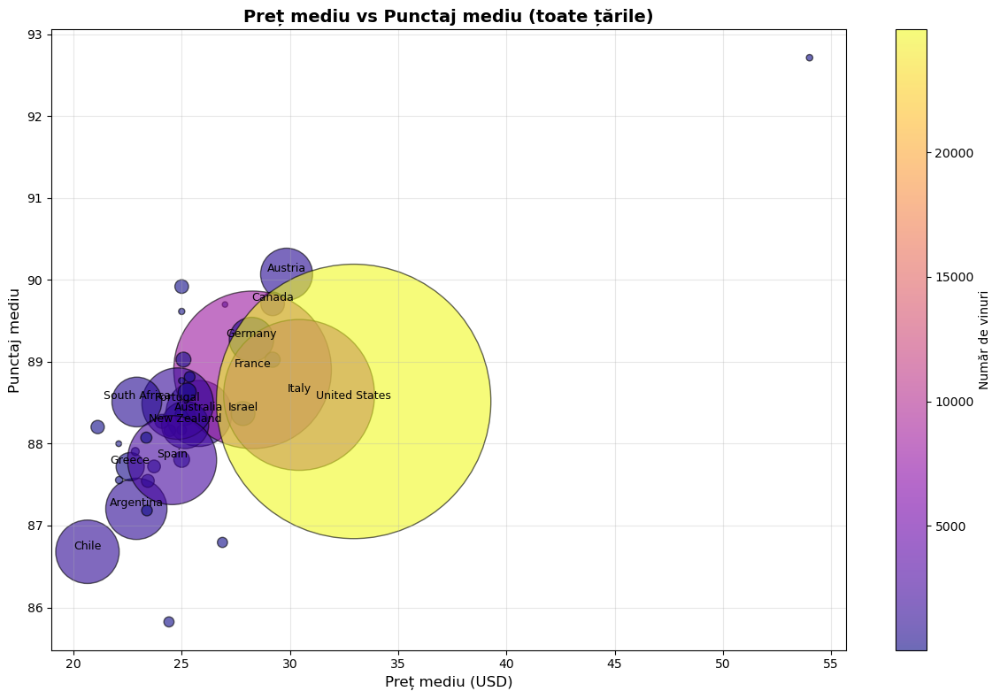

In [90]:
plt.figure(figsize=(12, 8))

scatter = plt.scatter(
    country_stats['price'],
    country_stats['points'],
    s=country_stats['count'] * 2,  # mărimea = număr de vinuri
    alpha=0.6,
    c=country_stats['count'],
    cmap='plasma',
    edgecolor='black'
)

plt.title('Preț mediu vs Punctaj mediu (toate țările)', fontsize=14, fontweight='bold')
plt.xlabel('Preț mediu (USD)', fontsize=12)
plt.ylabel('Punctaj mediu', fontsize=12)

# Etichetăm țările cu cele mai multe vinuri
for country, row in country_stats.sort_values('count', ascending=False).head(15).iterrows():
    plt.text(row['price'], row['points'], country, fontsize=9, ha='center', va='bottom')

cbar = plt.colorbar(scatter)
cbar.set_label('Număr de vinuri')

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/pret_vs_punctaj_tari.pdf", bbox_inches='tight')
plt.show()

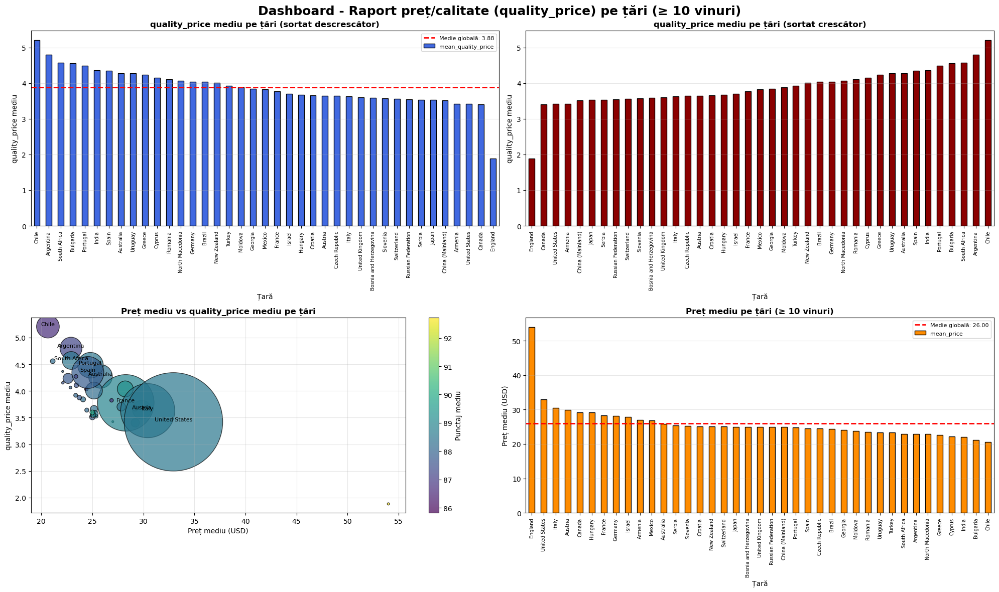


Primele 10 țări după quality_price mediu (≥ 10 vinuri):
              mean_quality_price  mean_price  mean_points  count
country                                                         
Chile                       5.21       20.65        86.68   1334
Argentina                   4.80       22.91        87.20   1243
South Africa                4.57       22.93        88.51    819
Bulgaria                    4.56       21.12        88.20     59
Portugal                    4.48       24.81        88.49   1689
India                       4.37       22.09        88.00     11
Spain                       4.35       24.56        87.80   2625
Australia                   4.27       25.79        88.37   1446
Uruguay                     4.27       23.39        87.18     38
Greece                      4.24       22.62        87.72    264

Ultimele 10 țări după quality_price mediu (≥ 10 vinuri):
                    mean_quality_price  mean_price  mean_points  count
country                           

In [92]:
dfc = df_clean.copy()

# Agregăm statistici pe țară
quality_stats = dfc.groupby('country', observed=False).agg(
    mean_quality_price=('quality_price', 'mean'),
    median_quality_price=('quality_price', 'median'),
    mean_price=('price', 'mean'),
    mean_points=('points', 'mean'),
    count=('country', 'count')
).dropna()

# Filtrăm doar țările cu cel puțin 10 vinuri
min_wines = 10
quality_stats_f = quality_stats[quality_stats['count'] >= min_wines]

# Sortări pentru afișare
qp_by_country = quality_stats_f.sort_values('mean_quality_price', ascending=False)
qp_low_by_country = quality_stats_f.sort_values('mean_quality_price', ascending=True)
qp_by_price = quality_stats_f.sort_values('mean_price', ascending=False)

fig, axes = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle(f'Dashboard - Raport preț/calitate (quality_price) pe țări (≥ {min_wines} vinuri)', 
             fontsize=18, fontweight='bold')

# 1) quality_price mediu pe țări (toate țările cu ≥ min_wines, sortate descrescător)
ax1 = axes[0, 0]
qp_by_country['mean_quality_price'].plot(
    kind='bar', ax=ax1, color='royalblue', edgecolor='black'
)
ax1.set_title('quality_price mediu pe țări (sortat descrescător)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Țară', fontsize=10)
ax1.set_ylabel('quality_price mediu', fontsize=10)
ax1.tick_params(axis='x', labelrotation=90, labelsize=7)
ax1.axhline(qp_by_country['mean_quality_price'].mean(), color='red', linestyle='--',
            linewidth=2, label=f'Medie globală: {qp_by_country["mean_quality_price"].mean():.2f}')
ax1.legend(loc='upper right', fontsize=8)
ax1.grid(axis='y', alpha=0.3)

# 2) quality_price mediu pe țări (sortat crescător)
ax2 = axes[0, 1]
qp_low_by_country['mean_quality_price'].plot(
    kind='bar', ax=ax2, color='darkred', edgecolor='black'
)
ax2.set_title('quality_price mediu pe țări (sortat crescător)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Țară', fontsize=10)
ax2.set_ylabel('quality_price mediu', fontsize=10)
ax2.tick_params(axis='x', labelrotation=90, labelsize=7)
ax2.grid(axis='y', alpha=0.3)

# 3) Preț mediu vs quality_price mediu pe țări (scatter)
ax3 = axes[1, 0]
scatter = ax3.scatter(
    quality_stats_f['mean_price'],
    quality_stats_f['mean_quality_price'],
    s=quality_stats_f['count'] * 0.8,   # mărimea ~ numărul de vinuri
    alpha=0.7,
    c=quality_stats_f['mean_points'],   # culoare = punctaj mediu
    cmap='viridis',
    edgecolor='black'
)

ax3.set_title('Preț mediu vs quality_price mediu pe țări', fontsize=12, fontweight='bold')
ax3.set_xlabel('Preț mediu (USD)', fontsize=10)
ax3.set_ylabel('quality_price mediu', fontsize=10)
ax3.grid(True, alpha=0.3)

# Etichetăm țările cu cele mai multe vinuri
for country, row in quality_stats_f.sort_values('count', ascending=False).head(10).iterrows():
    ax3.text(row['mean_price'], row['mean_quality_price'], country,
             fontsize=8, ha='center', va='bottom')

cbar = plt.colorbar(scatter, ax=ax3)
cbar.set_label('Punctaj mediu')

# 4) Preț mediu pe țări (ca să vezi legătura cu quality_price)
ax4 = axes[1, 1]
qp_by_price['mean_price'].plot(
    kind='bar', ax=ax4, color='darkorange', edgecolor='black'
)
ax4.set_title('Preț mediu pe țări (≥ 10 vinuri)', fontsize=12, fontweight='bold')
ax4.set_xlabel('Țară', fontsize=10)
ax4.set_ylabel('Preț mediu (USD)', fontsize=10)
ax4.tick_params(axis='x', labelrotation=90, labelsize=7)
ax4.axhline(qp_by_price['mean_price'].mean(), color='red', linestyle='--',
            linewidth=2, label=f'Medie globală: {qp_by_price["mean_price"].mean():.2f}')
ax4.legend(loc='upper right', fontsize=8)
ax4.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig("./figures/raport_pret_calitate_per_tari.pdf", bbox_inches='tight')
plt.show()

# Tabel de sinteză pentru raport (primele și ultimele 10 țări după quality_price)
print("\nPrimele 10 țări după quality_price mediu (≥ 10 vinuri):")
print(qp_by_country[['mean_quality_price', 'mean_price', 'mean_points', 'count']].head(10).round(2))

print("\nUltimele 10 țări după quality_price mediu (≥ 10 vinuri):")
print(qp_low_by_country[['mean_quality_price', 'mean_price', 'mean_points', 'count']].head(10).round(2))

#### Distributia dupa categoria vinului

In [93]:
cat_counts = df_clean['category'].value_counts()
cat_percent = (df_clean['category'].value_counts(normalize=True) * 100).round(2)

cat_dist = pd.DataFrame({
    'count': cat_counts,
    'percent': cat_percent
})

print("Distribuția vinurilor pe categorii:")
print(cat_dist)

Distribuția vinurilor pe categorii:
             count  percent
category                   
Red          36912    68.43
White        13392    24.83
Rose          1648     3.06
Sparkling     1265     2.35
Dessert        486     0.90
Port/Sherry    211     0.39
Orange          13     0.02
Fortified       13     0.02


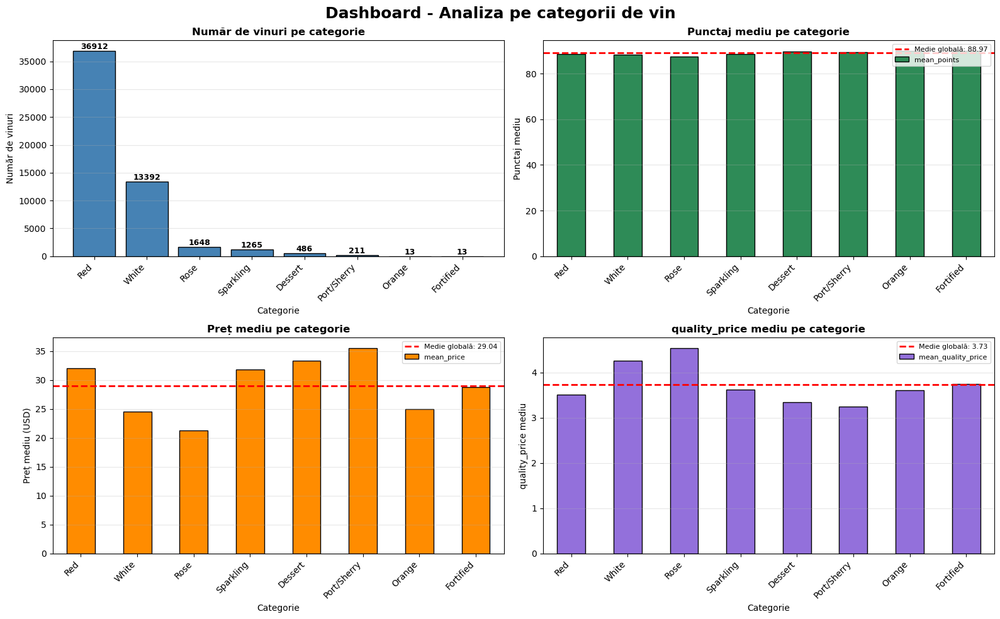


Statistici pe categorii:
             count  mean_points  mean_price  mean_quality_price
category                                                       
Red          36912        88.60       32.06                3.52
White        13392        88.26       24.50                4.26
Rose          1648        87.44       21.28                4.54
Sparkling     1265        88.67       31.86                3.63
Dessert        486        89.52       33.32                3.34
Port/Sherry    211        89.24       35.54                3.24
Orange          13        90.00       25.00                3.60
Fortified       13        90.00       28.77                3.74


In [96]:
import matplotlib.pyplot as plt

dfc = df_clean.copy()

# Statistici agregate pe categorie
cat_stats = dfc.groupby('category', observed=False).agg(
    count=('category', 'count'),
    mean_points=('points', 'mean'),
    mean_price=('price', 'mean'),
    mean_quality_price=('quality_price', 'mean')
).sort_values('count', ascending=False)

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle('Dashboard - Analiza pe categorii de vin', fontsize=18, fontweight='bold')

categories_order = cat_stats.index

# 1) Număr de vinuri pe categorie (CU VALORI PE BARE)
ax1 = axes[0, 0]
bars = ax1.bar(range(len(cat_stats)), cat_stats['count'], color='steelblue', edgecolor='black')
ax1.set_title('Număr de vinuri pe categorie', fontsize=12, fontweight='bold')
ax1.set_xlabel('Categorie', fontsize=10)
ax1.set_ylabel('Număr de vinuri', fontsize=10)
ax1.set_xticks(range(len(cat_stats)))
ax1.set_xticklabels(cat_stats.index, rotation=45, ha='right')
ax1.grid(axis='y', alpha=0.3)

# Adăugăm valorile numerice deasupra fiecărei bare
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}',
             ha='center', va='bottom', fontsize=9, fontweight='bold')

# 2) Punctaj mediu pe categorie
ax2 = axes[0, 1]
cat_stats['mean_points'].plot(kind='bar', ax=ax2, color='seagreen', edgecolor='black')
ax2.set_title('Punctaj mediu pe categorie', fontsize=12, fontweight='bold')
ax2.set_xlabel('Categorie', fontsize=10)
ax2.set_ylabel('Punctaj mediu', fontsize=10)
ax2.tick_params(axis='x', labelrotation=45)
for label in ax2.get_xticklabels():
    label.set_ha('right')
ax2.axhline(cat_stats['mean_points'].mean(), color='red', linestyle='--',
            linewidth=2, label=f'Medie globală: {cat_stats['mean_points'].mean():.2f}')
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(axis='y', alpha=0.3)

# 3) Preț mediu pe categorie
ax3 = axes[1, 0]
cat_stats['mean_price'].plot(kind='bar', ax=ax3, color='darkorange', edgecolor='black')
ax3.set_title('Preț mediu pe categorie', fontsize=12, fontweight='bold')
ax3.set_xlabel('Categorie', fontsize=10)
ax3.set_ylabel('Preț mediu (USD)', fontsize=10)
ax3.tick_params(axis='x', labelrotation=45)
for label in ax3.get_xticklabels():
    label.set_ha('right')
ax3.axhline(cat_stats['mean_price'].mean(), color='red', linestyle='--',
            linewidth=2, label=f'Medie globală: {cat_stats['mean_price'].mean():.2f}')
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(axis='y', alpha=0.3)

# 4) quality_price mediu pe categorie
ax4 = axes[1, 1]
cat_stats['mean_quality_price'].plot(kind='bar', ax=ax4, color='mediumpurple', edgecolor='black')
ax4.set_title('quality_price mediu pe categorie', fontsize=12, fontweight='bold')
ax4.set_xlabel('Categorie', fontsize=10)
ax4.set_ylabel('quality_price mediu', fontsize=10)
ax4.tick_params(axis='x', labelrotation=45)
for label in ax4.get_xticklabels():
    label.set_ha('right')
ax4.axhline(cat_stats['mean_quality_price'].mean(), color='red', linestyle='--',
            linewidth=2, label=f'Medie globală: {cat_stats['mean_quality_price'].mean():.2f}')
ax4.legend(loc='upper right', fontsize=8)
ax4.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig("./figures/distributia_per_categorie.pdf", bbox_inches='tight')
plt.show()

print("\nStatistici pe categorii:")
print(cat_stats.round(2))

# Analiza textului

## Curățarea textului și tokenizare

In [106]:
descriptions = df_clean['description'].dropna().astype(str)

# funcție de curățare simplă
def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^a-zA-Zăâîșțöüéèóòçñãõüäöß\' ]', ' ', text)  # păstrăm litere și spații
    text = re.sub(r'\s+', ' ', text).strip()
    return text

descriptions_clean = descriptions.apply(clean_text)

### Cele mai frecvente cuvinte (fără stopwords)

In [ ]:
from collections import Counter

stop_words = set(stopwords.words('english'))
# poți adăuga manual stopwords specifice domeniului sau limbii
custom_stop = {'wine', 'wines', 'flavors', 'flavour', 'aromas', 
               'drink', 'drinking', 'note', 'notes', 'finish',
               'and', 'the', 'this'}  # extinde după ce vezi rezultatele
stop_words |= custom_stop

all_tokens = []

for text in descriptions_clean:
    tokens = word_tokenize(text)
    tokens = [t for t in tokens if t.isalpha() and t not in stop_words]
    all_tokens.extend(tokens)

word_freq = Counter(all_tokens)

In [110]:
print("Cele mai frecvente 30 de cuvinte în descrieri (fără stopwords):")
for word, freq in word_freq.most_common(30):
    print(f"{word}: {freq}")

Cele mai frecvente 30 de cuvinte în descrieri (fără stopwords):
fruit: 21085
palate: 15717
tannins: 12888
acidity: 12708
cherry: 11960
black: 11257
ripe: 10523
nose: 9064
red: 8570
oak: 8032
spice: 7503
rich: 7311
dry: 7086
fresh: 6717
full: 5962
sweet: 5867
berry: 5577
plum: 5467
well: 5452
blackberry: 5279
apple: 5259
soft: 5234
dark: 4931
white: 4901
blend: 4848
fruits: 4839
light: 4816
vanilla: 4785
texture: 4620
good: 4616


### Lungimea medie a descrierii

In [111]:
desc_lengths_words = descriptions_clean.apply(lambda x: len(word_tokenize(x)))
desc_lengths_chars = descriptions_clean.apply(len)

print("Lungimea medie a descrierii (în cuvinte):", desc_lengths_words.mean())
print("Lungimea mediană a descrierii (în cuvinte):", desc_lengths_words.median())

print("Lungimea medie a descrierii (în caractere):", desc_lengths_chars.mean())
print("Lungimea mediană a descrierii (în caractere):", desc_lengths_chars.median())

Lungimea medie a descrierii (în cuvinte): 38.82945865776789
Lungimea mediană a descrierii (în cuvinte): 39.0
Lungimea medie a descrierii (în caractere): 221.5252317389692
Lungimea mediană a descrierii (în caractere): 221.0


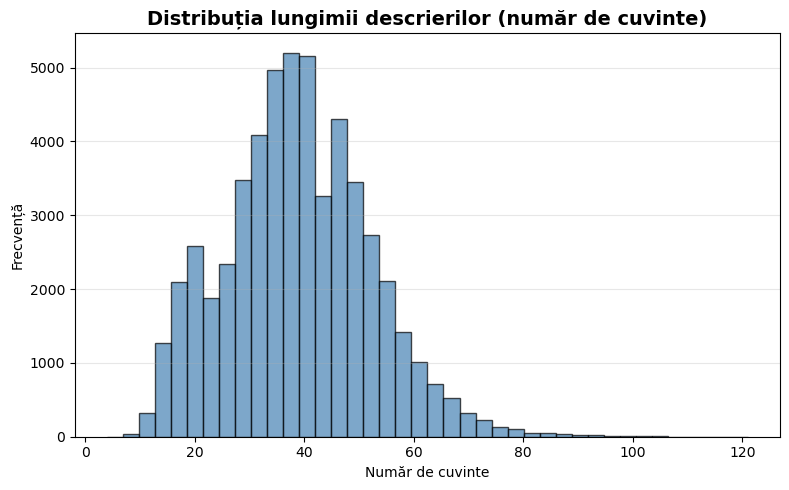

In [113]:
plt.figure(figsize=(8, 5))
plt.hist(desc_lengths_words, bins=40, color='steelblue', edgecolor='black', alpha=0.7)
plt.title('Distribuția lungimii descrierilor (număr de cuvinte)', fontsize=14, fontweight='bold')
plt.xlabel('Număr de cuvinte')
plt.ylabel('Frecvență')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/distributia_ligimii_descrierilor.pdf", bbox_inches='tight')
plt.show()

## Wordcloud

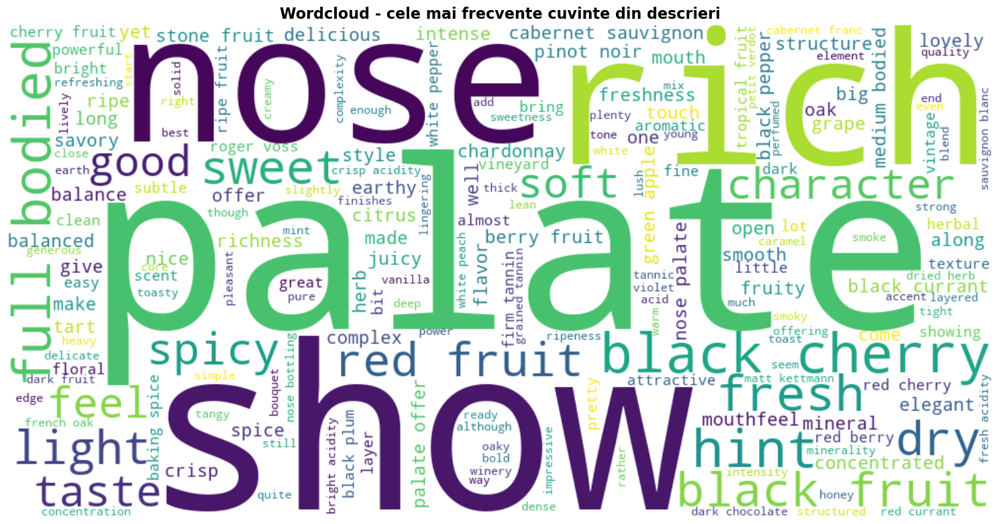

In [116]:
from wordcloud import WordCloud

# reconstruim textul, dar folosind deja lista de tokens fără stopwords
text_for_wc = ' '.join(all_tokens)

wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    max_words=200
).generate(text_for_wc)

plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Wordcloud - cele mai frecvente cuvinte din descrieri', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig("./figures/worldcould_descrieri.pdf", bbox_inches='tight')
plt.show()

## Word corellation analysis

In [117]:
dfc = df_clean.copy()

descriptions = dfc['description'].fillna('').astype(str).str.lower()

def clean_text(text):
    text = re.sub(r'[^a-zA-Z ]', ' ', text)   # păstrăm doar litere și spații
    text = re.sub(r'\s+', ' ', text).strip()
    return text

descriptions_clean = descriptions.apply(clean_text)

stop_words = set(stopwords.words('english'))
domain_stop = {
    'wine','wines','flavors','flavour','aromas','aroma','nose',
    'drink','drinking','note','notes','finish','palate','style',
    'and','the','this'
}
stop_words |= domain_stop

tokens_per_row = descriptions_clean.apply(
    lambda x: [t for t in word_tokenize(x) if t.isalpha() and t not in stop_words]
)

word_freq = Counter()
tokens_per_row.apply(word_freq.update)

# Alegem câteva cuvinte frecvente pentru analiză (poți ajusta lista)
candidate_words = [w for (w, f) in word_freq.most_common(80)
                   if f >= 100 and len(w) > 3][:15]

candidate_words

['fruit',
 'tannins',
 'acidity',
 'cherry',
 'black',
 'ripe',
 'spice',
 'rich',
 'fresh',
 'full',
 'sweet',
 'berry',
 'plum',
 'well',
 'blackberry']

In [118]:
# Ne asigurăm că avem o versiune curată (fără caractere dubioase)
text_series = descriptions_clean

for w in candidate_words:
    pattern = rf'\b{re.escape(w)}\b'
    dfc[f'word_{w}'] = text_series.str.contains(pattern, regex=True)

In [119]:
metrics = ['price', 'points', 'quality_price']
rows = []

for w in candidate_words:
    col = f'word_{w}'
    sub = dfc[[col] + metrics].dropna()
    
    present = sub[sub[col]]
    absent = sub[~sub[col]]
    
    row = {
        'word': w,
        'n_with': present.shape[0],
        'n_without': absent.shape[0],
        'frac_with': present.shape[0] / sub.shape[0]
    }
    
    for m in metrics:
        m_with = present[m].mean()
        m_without = absent[m].mean()
        row[f'{m}_with'] = m_with
        row[f'{m}_without'] = m_without
        row[f'{m}_diff'] = m_with - m_without  # >0: asociat cu valori mai mari
    
    rows.append(row)

word_metric_summary = pd.DataFrame(rows)
word_metric_summary = word_metric_summary.sort_values('points_diff', ascending=False)

word_metric_summary.round(3)

,word,n_with,n_without,frac_with,price_with,price_without,price_diff,points_with,points_without,points_diff,quality_price_with,quality_price_without,quality_price_diff
7,rich,7046,46894,0.131,33.629,29.304,4.325,89.677,88.319,1.358,3.352,3.787,-0.436
4,black,9639,44301,0.179,34.548,28.851,5.697,89.512,88.275,1.237,3.279,3.829,-0.550
13,well,5100,48840,0.095,31.169,29.733,1.436,89.298,88.412,0.885,3.629,3.741,-0.113
9,full,5732,48208,0.106,31.340,29.694,1.645,89.266,88.405,0.861,3.597,3.746,-0.149
1,tannins,12543,41397,0.233,33.128,28.882,4.246,89.069,88.323,0.747,3.383,3.836,-0.453
5,ripe,9933,44007,0.184,30.961,29.622,1.339,89.093,88.361,0.732,3.584,3.764,-0.179
6,spice,7234,46706,0.134,31.519,29.613,1.906,89.096,88.403,0.693,3.546,3.759,-0.213
14,blackberry,5114,48826,0.095,34.204,29.415,4.789,88.864,88.458,0.406,3.388,3.766,-0.379
12,plum,5137,48803,0.095,30.762,29.775,0.987,88.808,88.463,0.345,3.689,3.735,-0.046
2,acidity,12482,41458,0.231,29.117,30.096,-0.979,88.750,88.420,0.331,3.796,3.711,0.085


In [120]:
print(word_metric_summary[['word',
                           'n_with','frac_with',
                           'price_diff','points_diff','quality_price_diff']].round(3))

          word  n_with  frac_with  price_diff  points_diff  quality_price_diff
7         rich    7046      0.131       4.325        1.358              -0.436
4        black    9639      0.179       5.697        1.237              -0.550
13        well    5100      0.095       1.436        0.885              -0.113
9         full    5732      0.106       1.645        0.861              -0.149
1      tannins   12543      0.233       4.246        0.747              -0.453
5         ripe    9933      0.184       1.339        0.732              -0.179
6        spice    7234      0.134       1.906        0.693              -0.213
14  blackberry    5114      0.095       4.789        0.406              -0.379
12        plum    5137      0.095       0.987        0.345              -0.046
2      acidity   12482      0.231      -0.979        0.331               0.085
3       cherry   11250      0.209       4.853        0.330              -0.465
0        fruit   18843      0.349       0.610       

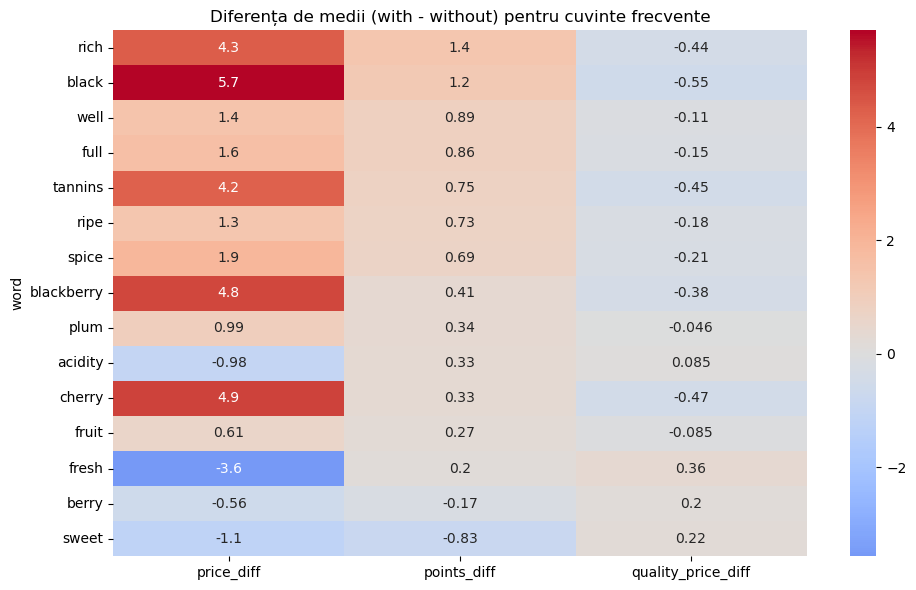

In [123]:
plt.figure(figsize=(10, 6))
sns.heatmap(
    word_metric_summary.set_index('word')[['price_diff','points_diff','quality_price_diff']].round(3),
    annot=True, cmap='coolwarm', center=0
)
plt.title('Diferența de medii (with - without) pentru cuvinte frecvente')
plt.tight_layout()
plt.savefig("./figures/heatmap_diff_med_candidate_words.pdf", bbox_inches='tight')
plt.show()

# Analiza Corelațiilor

## Corelații numerice (heatmap)

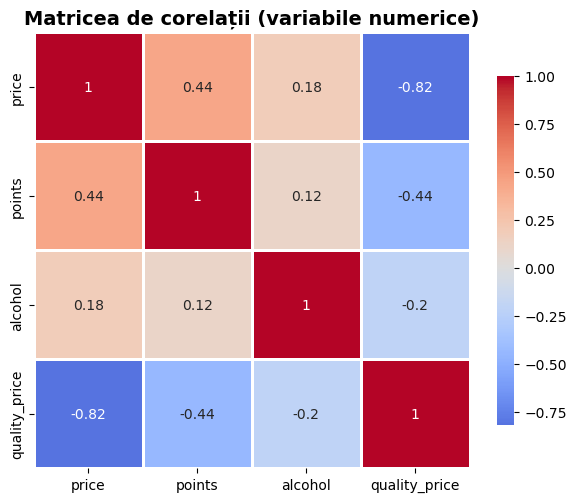

               price  points  alcohol  quality_price
price          1.000   0.436    0.178         -0.816
points         0.436   1.000    0.118         -0.437
alcohol        0.178   0.118    1.000         -0.200
quality_price -0.816  -0.437   -0.200          1.000


In [125]:
num_cols = ['price', 'points', 'alcohol', 'quality_price']

corr_matrix = df_clean[num_cols].corr()

plt.figure(figsize=(6, 5))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={'shrink': 0.8}
)
plt.title('Matricea de corelații (variabile numerice)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("./figures/matrice_corelatii.pdf", bbox_inches='tight')
plt.show()

print(corr_matrix.round(3))

## Scatter plots pentru relații individuale (price–points, alcohol–points)

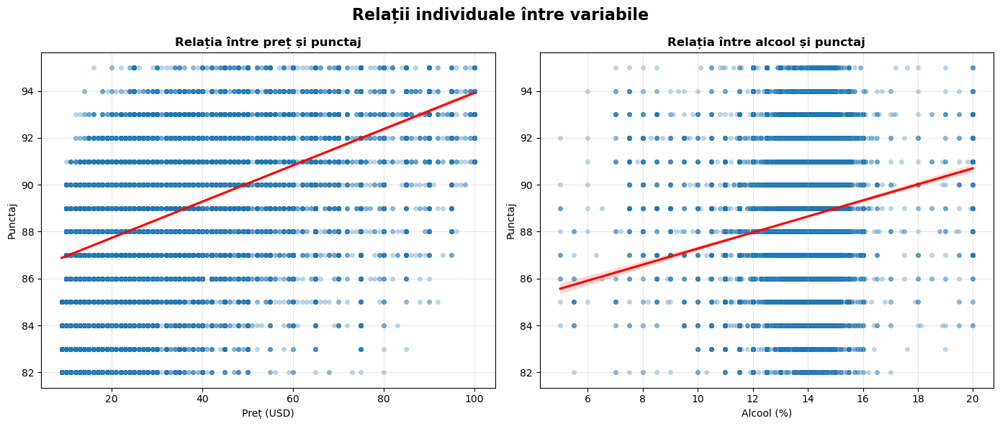

In [126]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Relații individuale între variabile', fontsize=16, fontweight='bold')

# 1) price vs points
ax1 = axes[0]
sns.scatterplot(
    data=df_clean, x='price', y='points',
    alpha=0.3, edgecolor=None, s=20, ax=ax1
)
sns.regplot(
    data=df_clean, x='price', y='points',
    scatter=False, color='red', ax=ax1
)
ax1.set_title('Relația între preț și punctaj', fontsize=12, fontweight='bold')
ax1.set_xlabel('Preț (USD)')
ax1.set_ylabel('Punctaj')
ax1.grid(True, alpha=0.3)

# 2) alcohol vs points
ax2 = axes[1]
sns.scatterplot(
    data=df_clean, x='alcohol', y='points',
    alpha=0.3, edgecolor=None, s=20, ax=ax2
)
sns.regplot(
    data=df_clean, x='alcohol', y='points',
    scatter=False, color='red', ax=ax2
)
ax2.set_title('Relația între alcool și punctaj', fontsize=12, fontweight='bold')
ax2.set_xlabel('Alcool (%)')
ax2.set_ylabel('Punctaj')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Regiune vs price/points

In [127]:
dfc = df_clean.copy()

min_wines_region = 20

region_stats = dfc.groupby('province', observed=False).agg(
    mean_price=('price', 'mean'),
    mean_points=('points', 'mean'),
    count=('province', 'count')
).dropna()

region_stats_f = region_stats[region_stats['count'] >= min_wines_region]

print("Statistici pe regiuni (primele 10 după număr de vinuri):")
print(region_stats_f.sort_values('count', ascending=False).head(10).round(2))

Statistici pe regiuni (primele 10 după număr de vinuri):
                  mean_price  mean_points  count
province                                        
California             33.61        88.46  18233
Washington             30.57        88.91   4031
Oregon                 33.74        89.01   2187
Bordeaux               25.41        89.00   2084
Tuscany                34.12        88.96   1768
Piedmont               36.14        89.38   1252
Burgundy               36.81        89.13   1228
Veneto                 29.76        87.99   1227
Northern Spain         25.23        87.54   1085
Mendoza Province       22.95        87.03    895


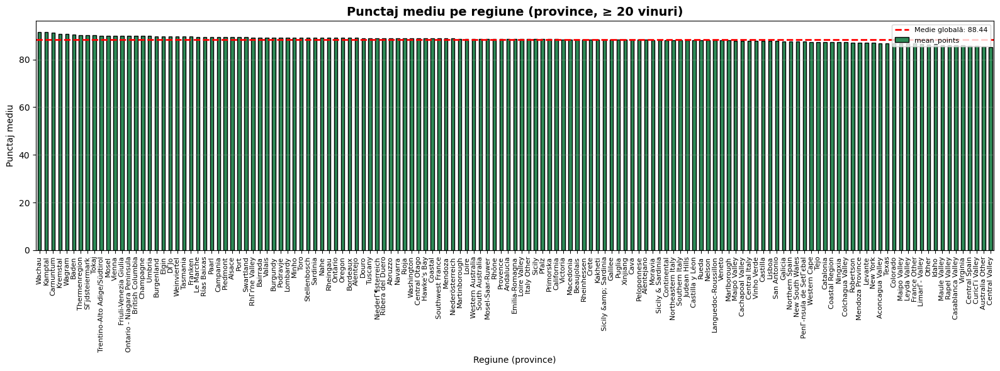

In [129]:
top_by_points = region_stats_f.sort_values('mean_points', ascending=False)
top_by_price = region_stats_f.sort_values('mean_price', ascending=False)

plt.figure(figsize=(16, 6))
ax = plt.gca()
top_by_points['mean_points'].plot(kind='bar', ax=ax, color='seagreen', edgecolor='black')
ax.set_title(f'Punctaj mediu pe regiune (province, ≥ {min_wines_region} vinuri)', fontsize=14, fontweight='bold')
ax.set_xlabel('Regiune (province)')
ax.set_ylabel('Punctaj mediu')
ax.tick_params(axis='x', labelrotation=90, labelsize=8)
ax.axhline(region_stats_f['mean_points'].mean(), color='red', linestyle='--',
           linewidth=2, label=f'Medie globală: {region_stats_f["mean_points"].mean():.2f}')
ax.legend(loc='upper right', fontsize=8)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/punctaj_med_pe_regiune.pdf", bbox_inches='tight')
plt.show()

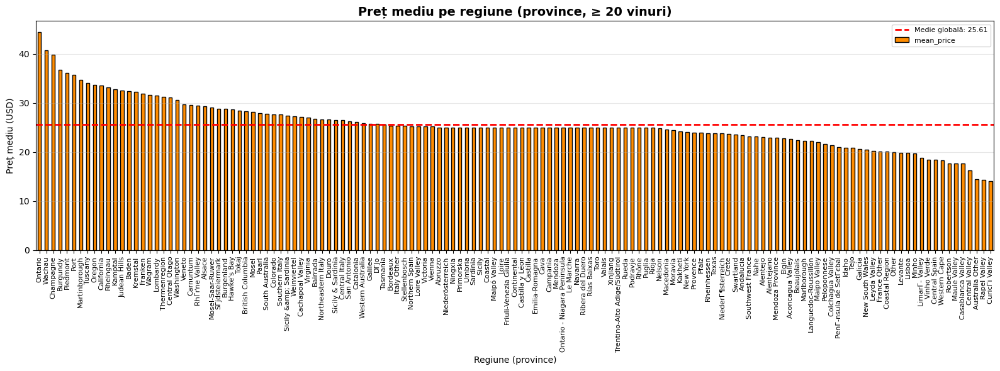

In [131]:
plt.figure(figsize=(16, 6))
ax = plt.gca()
top_by_price['mean_price'].plot(kind='bar', ax=ax, color='darkorange', edgecolor='black')
ax.set_title(f'Preț mediu pe regiune (province, ≥ {min_wines_region} vinuri)', fontsize=14, fontweight='bold')
ax.set_xlabel('Regiune (province)')
ax.set_ylabel('Preț mediu (USD)')
ax.tick_params(axis='x', labelrotation=90, labelsize=8)
ax.axhline(region_stats_f['mean_price'].mean(), color='red', linestyle='--',
           linewidth=2, label=f'Medie globală: {region_stats_f["mean_price"].mean():.2f}')
ax.legend(loc='upper right', fontsize=8)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/pret_mediu_pe_regiune.pdf", bbox_inches='tight')
plt.show()

## Soi (variety) vs price/points

In [132]:
min_wines_variety = 30

variety_stats = dfc.groupby('variety', observed=False).agg(
    mean_price=('price', 'mean'),
    mean_points=('points', 'mean'),
    count=('variety', 'count')
).dropna()

variety_stats_f = variety_stats[variety_stats['count'] >= min_wines_variety]

print("Statistici pe soiuri (primele 10 după număr de vinuri):")
print(variety_stats_f.sort_values('count', ascending=False).head(10).round(2))

Statistici pe soiuri (primele 10 după număr de vinuri):
                          mean_price  mean_points  count
variety                                                 
Pinot Noir                     33.79        89.58   9456
Chardonnay                     28.94        88.26   4755
Cabernet Sauvignon             39.34        88.40   3787
Red Blend                      32.11        88.17   2771
Bordeaux-style Red Blend       33.15        89.16   2059
Syrah                          34.55        88.79   1964
Sauvignon Blanc                20.66        87.49   1907
Merlot                         27.32        87.13   1570
Riesling                       26.23        89.11   1508
Zinfandel                      28.22        87.67   1390


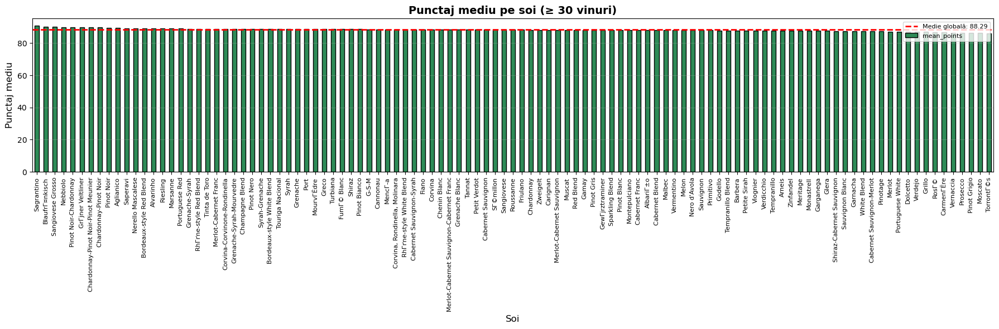

In [134]:
var_by_points = variety_stats_f.sort_values('mean_points', ascending=False)

plt.figure(figsize=(18, 6))
ax = plt.gca()
var_by_points['mean_points'].plot(kind='bar', ax=ax, color='seagreen', edgecolor='black')
ax.set_title(f'Punctaj mediu pe soi (≥ {min_wines_variety} vinuri)', fontsize=14, fontweight='bold')
ax.set_xlabel('Soi', fontsize=12)
ax.set_ylabel('Punctaj mediu', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)
ax.axhline(variety_stats_f['mean_points'].mean(), color='red', linestyle='--',
           linewidth=2, label=f'Medie globală: {variety_stats_f["mean_points"].mean():.2f}')
ax.legend(loc='upper right', fontsize=8)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/punctaj_med_pe_soi.pdf", bbox_inches='tight')
plt.show()

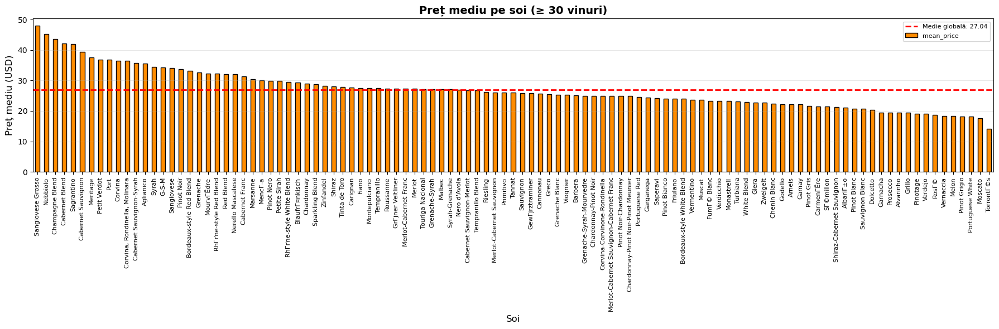

In [136]:
var_by_price = variety_stats_f.sort_values('mean_price', ascending=False)

plt.figure(figsize=(18, 6))
ax = plt.gca()
var_by_price['mean_price'].plot(kind='bar', ax=ax, color='darkorange', edgecolor='black')
ax.set_title(f'Preț mediu pe soi (≥ {min_wines_variety} vinuri)', fontsize=14, fontweight='bold')
ax.set_xlabel('Soi', fontsize=12)
ax.set_ylabel('Preț mediu (USD)', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)
ax.axhline(variety_stats_f['mean_price'].mean(), color='red', linestyle='--',
           linewidth=2, label=f'Medie globală: {variety_stats_f["mean_price"].mean():.2f}')
ax.legend(loc='upper right', fontsize=8)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/pret_med_pe_soi.pdf", bbox_inches='tight')
plt.show()

# Vizualizări Avansate

## Distributia punctajelor

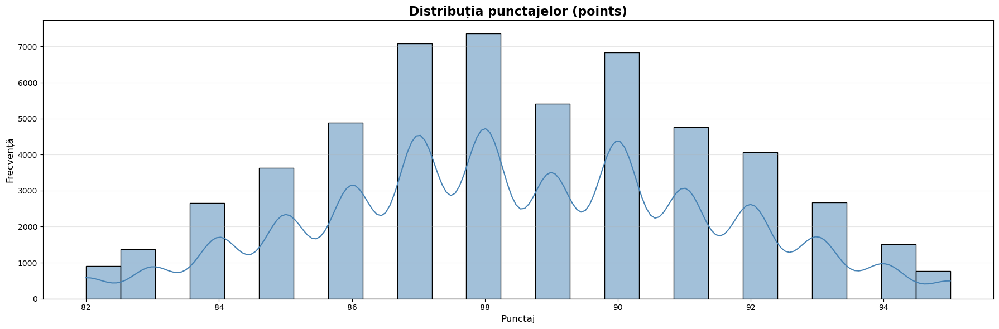

In [140]:
plt.figure(figsize=(18, 6))
sns.histplot(df_clean['points'], bins=25, kde=True,
             color='steelblue', edgecolor='black')
plt.title('Distribuția punctajelor (points)', fontsize=16, fontweight='bold')
plt.xlabel('Punctaj', fontsize=12)
plt.ylabel('Frecvență', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("./figures/distributia_punctajelor.pdf", bbox_inches='tight')
plt.show()

## Prețurile medii pe țară (country)

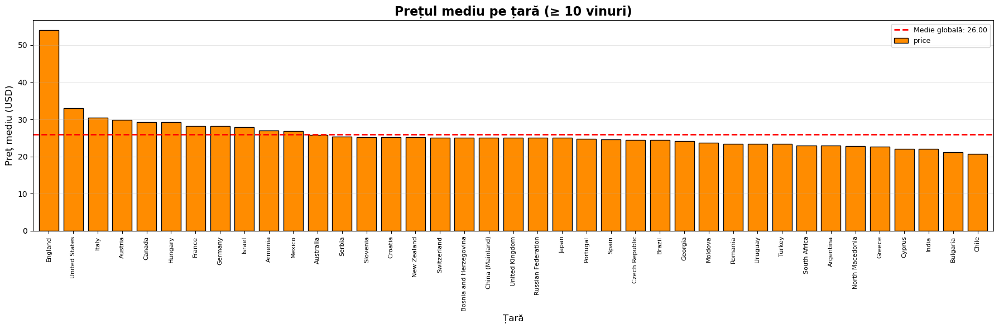

In [141]:
dfc = df_clean.copy()

# calculăm prețul mediu pe țară
country_price_mean = (
    dfc.groupby('country', observed=False)['price']
       .mean()
       .sort_values(ascending=False)
)

# filtrăm doar țările cu cel puțin 10 vinuri
min_wines_country = 10
country_counts = dfc['country'].value_counts()
valid_countries = country_counts[country_counts >= min_wines_country].index
country_price_mean = country_price_mean[country_price_mean.index.isin(valid_countries)]

plt.figure(figsize=(18, 6))
ax = plt.gca()

country_price_mean.plot(kind='bar', ax=ax, color='darkorange', edgecolor='black', width=0.8)

ax.set_title(f'Prețul mediu pe țară (≥ {min_wines_country} vinuri)', fontsize=16, fontweight='bold')
ax.set_xlabel('Țară', fontsize=12)
ax.set_ylabel('Preț mediu (USD)', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)

# linie de medie globală
ax.axhline(country_price_mean.mean(), color='red', linestyle='--',
           linewidth=2, label=f'Medie globală: {country_price_mean.mean():.2f}')
ax.legend(loc='upper right', fontsize=9)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Distributia vinurilor dupa categorii si tari

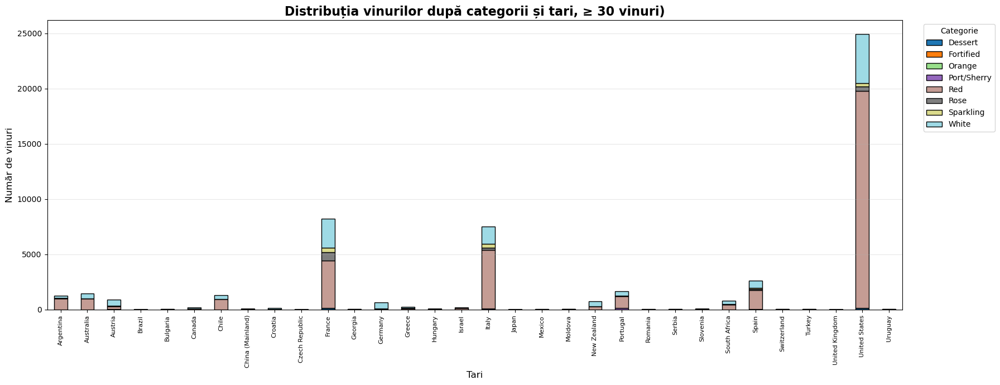

In [147]:
dfc = df_clean.copy()

# alegem doar regiunile cu suficient de multe vinuri
min_wines_country = 30
country_counts = dfc['country'].value_counts()
valid_countrys = country_counts[country_counts >= min_wines_country].index

df_country_cat = dfc[dfc['country'].isin(valid_countrys)].copy()

# tabel cross-tab: rânduri = regiuni, coloane = categorii
ct_country_category = pd.crosstab(df_country_cat['country'], df_country_cat['category'])

plt.figure(figsize=(18, 7))
ax = plt.gca()

ct_country_category.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    colormap='tab20',
    edgecolor='black'
)

ax.set_title(f'Distribuția vinurilor după categorii și tari, ≥ {min_wines_country} vinuri)', 
             fontsize=16, fontweight='bold')
ax.set_xlabel('Tari', fontsize=12)
ax.set_ylabel('Număr de vinuri', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)

ax.legend(title='Categorie', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig("./figures/distributia_dupa_categorii_si_tari.pdf", bbox_inches='tight')
plt.show()

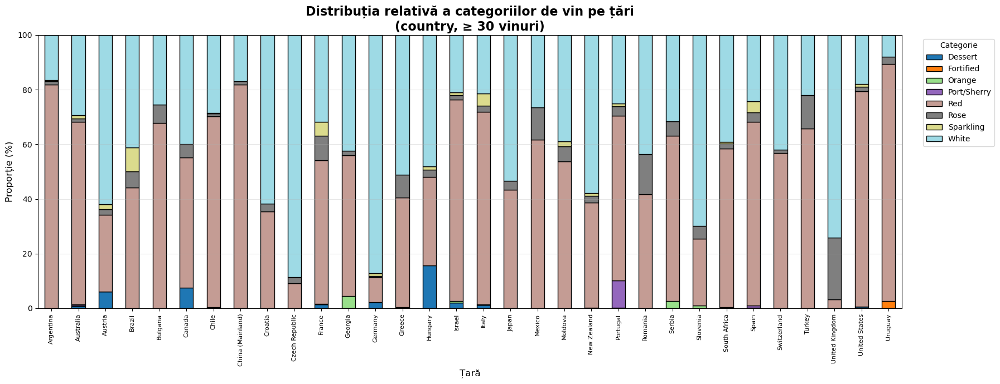

In [148]:
dfc = df_clean.copy()

# alegem doar țările cu suficient de multe vinuri
min_wines_country = 30
country_counts = dfc['country'].value_counts()
valid_countries = country_counts[country_counts >= min_wines_country].index

df_country_cat = dfc[dfc['country'].isin(valid_countries)].copy()

# tabel cross-tab: rânduri = țări, coloane = categorii
ct_country_category = pd.crosstab(df_country_cat['country'], df_country_cat['category'])

# Convertim la procente (normalizăm pe rânduri, adică pe fiecare țară)
ct_country_category_pct = ct_country_category.div(ct_country_category.sum(axis=1), axis=0) * 100

plt.figure(figsize=(18, 7))
ax = plt.gca()

ct_country_category_pct.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    colormap='tab20',
    edgecolor='black'
)

ax.set_title(
    f'Distribuția relativă a categoriilor de vin pe țări\n(country, ≥ {min_wines_country} vinuri)',
    fontsize=16, fontweight='bold'
)
ax.set_xlabel('Țară', fontsize=12)
ax.set_ylabel('Proporție (%)', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)

ax.legend(title='Categorie', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, 100)

plt.tight_layout()
plt.savefig("./figures/distributia_dupa_categorii_si_tari_relativ.pdf", bbox_inches='tight')
plt.show()

## Distribuția vinurilor după categorii și regiuni

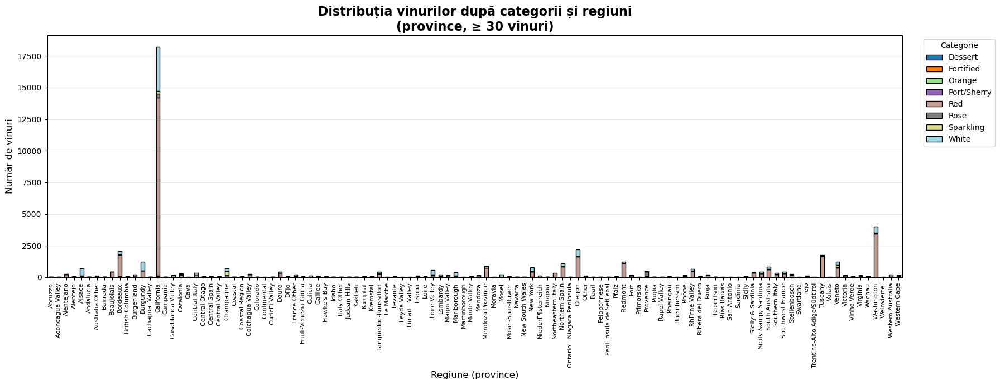

In [149]:
dfc = df_clean.copy()

# alegem doar regiunile cu suficient de multe vinuri
min_wines_region = 30
region_counts = dfc['province'].value_counts()
valid_regions = region_counts[region_counts >= min_wines_region].index

df_region_cat = dfc[dfc['province'].isin(valid_regions)].copy()

# tabel cross-tab: rânduri = regiuni, coloane = categorii
ct_region_category = pd.crosstab(df_region_cat['province'], df_region_cat['category'])

plt.figure(figsize=(18, 7))
ax = plt.gca()

ct_region_category.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    colormap='tab20',
    edgecolor='black'
)

ax.set_title(f'Distribuția vinurilor după categorii și regiuni\n(province, ≥ {min_wines_region} vinuri)', 
             fontsize=16, fontweight='bold')
ax.set_xlabel('Regiune (province)', fontsize=12)
ax.set_ylabel('Număr de vinuri', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)

ax.legend(title='Categorie', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig("./figures/distributia_dupa_categorii_si_regiuni.pdf", bbox_inches='tight')
plt.show()

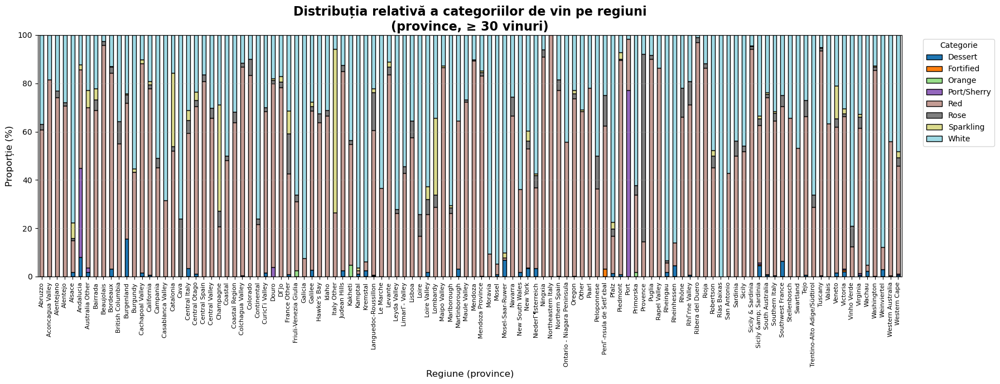

In [150]:
dfc = df_clean.copy()

# alegem doar regiunile cu suficient de multe vinuri
min_wines_region = 30
region_counts = dfc['province'].value_counts()
valid_regions = region_counts[region_counts >= min_wines_region].index

df_region_cat = dfc[dfc['province'].isin(valid_regions)].copy()

# tabel cross-tab: rânduri = regiuni, coloane = categorii
ct_region_category = pd.crosstab(df_region_cat['province'], df_region_cat['category'])

# Convertim la procente (normalizăm pe rânduri, adică pe fiecare regiune)
ct_region_category_pct = ct_region_category.div(ct_region_category.sum(axis=1), axis=0) * 100

plt.figure(figsize=(18, 7))
ax = plt.gca()

ct_region_category_pct.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    colormap='tab20',
    edgecolor='black'
)

ax.set_title(f'Distribuția relativă a categoriilor de vin pe regiuni\n(province, ≥ {min_wines_region} vinuri)', 
             fontsize=16, fontweight='bold')
ax.set_xlabel('Regiune (province)', fontsize=12)
ax.set_ylabel('Proporție (%)', fontsize=12)
ax.tick_params(axis='x', labelrotation=90, labelsize=8)

ax.legend(title='Categorie', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(axis='y', alpha=0.3)

# Setăm limita axei Y la 0–100 pentru claritate
ax.set_ylim(0, 100)

plt.tight_layout()
plt.savefig("./figures/distributia_dupa_categorii_si_regiuni_relativ.pdf", bbox_inches='tight')
plt.show()

## Scatter plot dintre pret si puncte

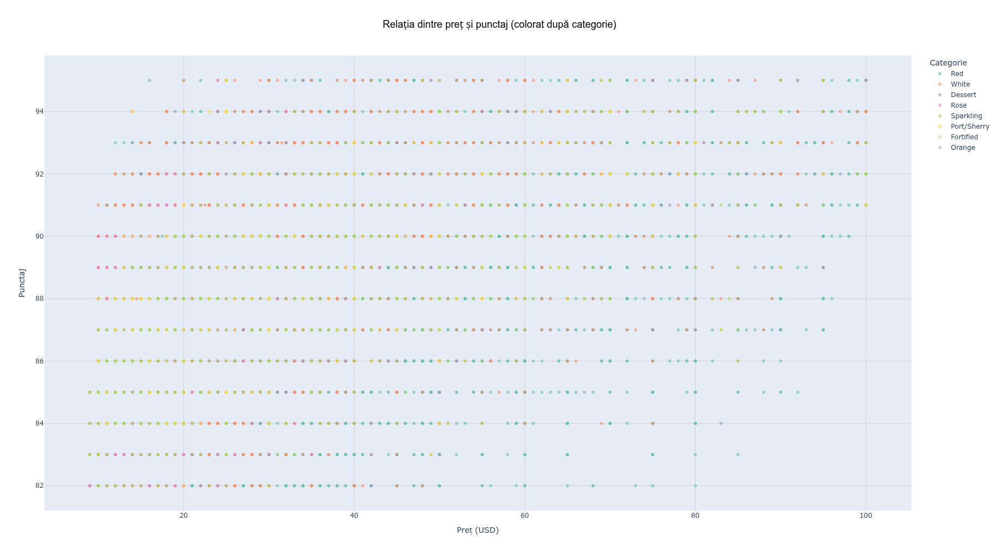

In [156]:
dfc = df_clean.copy()

fig = px.scatter(
    dfc,
    x='price',
    y='points',
    color='category',
    hover_data=['country', 'variety', 'winery', 'title'],
    title='Relația dintre preț și punctaj (colorat după categorie)',
    labels={'price': 'Preț (USD)', 'points': 'Punctaj'},
    opacity=0.6,
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_layout(
    width=1800,
    height=1000,
    title_font_size=18,
    title_font_family='Arial',
    title_font_color='black',
    title_x=0.5,
    xaxis=dict(showgrid=True, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridcolor='lightgray'),
    legend_title_text='Categorie'
)

fig.show()